<a href="https://colab.research.google.com/github/gulabpatel/Computer_Vision/blob/main/Object_Detection/09_MultiCrop_FasterRCNN_FineTunning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Faster-RCNN to identify the Crop type in the image**

# Configuration

File structure:

```
training_dataset/
├── images/
├── crop_object_detection_annot.csv

```

In [ ]:
CONFIGURATION = { "RANDOM_SEED" : 42,
                  "BATCH_SIZE" : 16,
                  "EPOCHS" : 50,
                  "LR" : 0.005,
                  "MOMENTUM" : 0.9,
                  "LR_SCHED_GAMMA" : 0.15,
                  "WEIGHT_DECAY" : 0.01,
                 }

## Installation and Imports

In [ ]:
!pip install torch

In [ ]:
import sys
import shutil
import numpy as np
import pandas as pd
import math
from matplotlib import pyplot as plt
import cv2
import os
from PIL import Image
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torch.utils.data import Dataset, DataLoader, Subset, random_split
import torchvision.transforms.functional as F
from tqdm import tqdm
from torchvision.ops import nms
import pickle
import glob as glob
import random

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip -o /content/drive/MyDrive/Dataset/training_dataset.zip

# EDA

In [ ]:
data = pd.read_csv("/content/training_dataset/crop_object_detection_annot.csv")

In [ ]:
data.sample(10)

,label_name,bbox_x,bbox_y,bbox_width,bbox_height,image_name,image_width,image_height
225,turmeric,899,3,290,140,Samanth_gt_20211216_111912616.jpg,1200,554
537,chilli,0,44,1200,856,Saptarshi_gt_20211216_120846246.jpg,1200,900
460,mustard,0,2162,6000,5838,35472bb3-d85f-11e9-90fc-b7cb9a623b4e$$9f7e3dee...,6000,8000
366,wheat,9,7,2439,3257,35472bb3-d85f-11e9-90fc-b7cb9a623b4e$$9f7abad9...,2448,3264
414,sugarcane,0,7881,21,119,35472bb3-d85f-11e9-90fc-b7cb9a623b4e$$9f7ae11b...,6000,8000
569,turmeric,3,211,1197,689,Siddarth_gt_20211215_115023469.jpg,1200,900
271,mustard,2,198,1198,694,Saptarshi_gt_20211215_112357024.jpg,1200,900
327,turmeric,0,283,1173,335,Saptarshi_gt_20211215_162251072.jpg,1200,900
191,Paddy,2,1,263,132,images38.jpg,268,188
130,mustard,97,33,1094,55,Samanth_gt_20211215_162454648.jpg,1200,554


In [ ]:
img_files = os.listdir("training_dataset/images/")
print(f"Total number of images are {len(img_files)}")
data = data[data['image_name'].isin(img_files)]
data.info()

Total number of images are 507
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 607 entries, 0 to 606
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   label_name    607 non-null    object
 1   bbox_x        607 non-null    int64 
 2   bbox_y        607 non-null    int64 
 3   bbox_width    607 non-null    int64 
 4   bbox_height   607 non-null    int64 
 5   image_name    607 non-null    object
 6   image_width   607 non-null    int64 
 7   image_height  607 non-null    int64 
dtypes: int64(6), object(2)
memory usage: 38.1+ KB


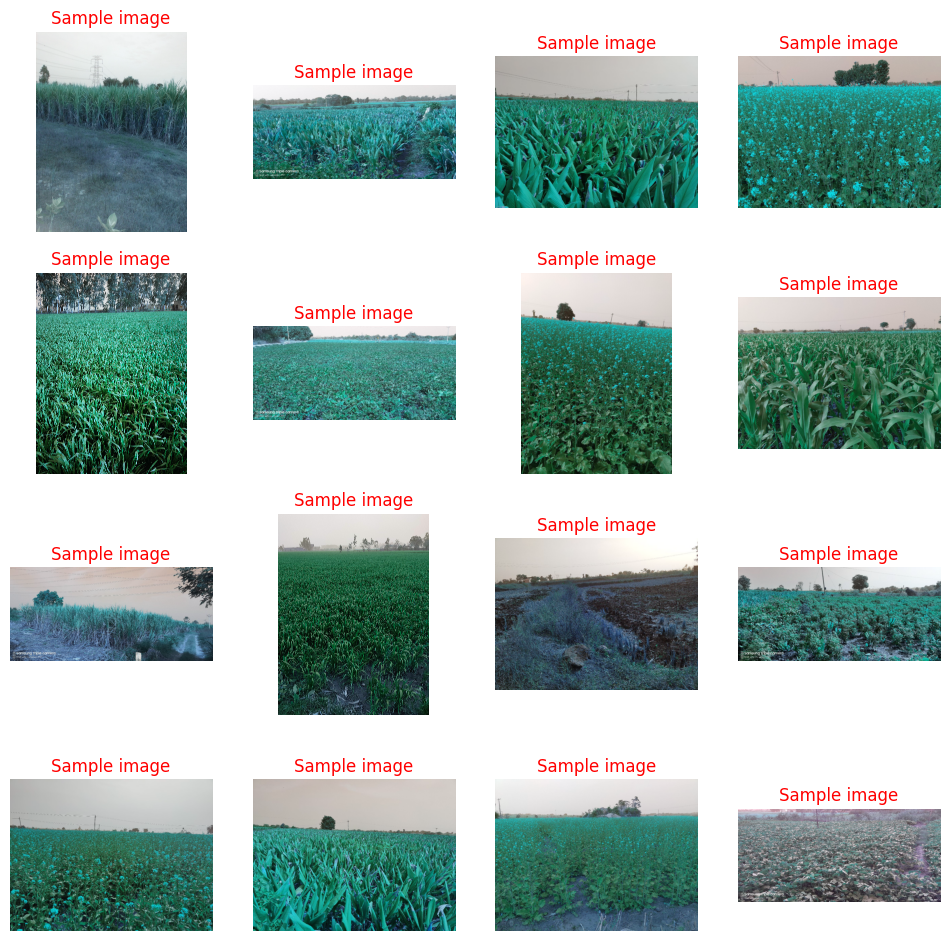

In [ ]:
i = 0
plt.figure(figsize=(12, 12))
for images in img_files[:16]:
    ax = plt.subplot(4,4, i+1)
    image = cv2.imread(f'training_dataset/images/{images}',cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.title('Sample image', color = 'red')
    plt.axis('off')
    i+=1

## EDA of annotation file and Images

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 607 entries, 0 to 606
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   label_name    607 non-null    object
 1   bbox_x        607 non-null    int64 
 2   bbox_y        607 non-null    int64 
 3   bbox_width    607 non-null    int64 
 4   bbox_height   607 non-null    int64 
 5   image_name    607 non-null    object
 6   image_width   607 non-null    int64 
 7   image_height  607 non-null    int64 
dtypes: int64(6), object(2)
memory usage: 38.1+ KB


## Class imbalance check

In [ ]:
#frequenct counts
data[['label_name']].value_counts()

label_name
turmeric      151
sugarcane     100
mustard        86
maize          65
chilli         57
black gram     54
wheat          45
Paddy          40
potato          8
green gram      1
Name: count, dtype: int64

We can say from the above result that data is highly imbalanced.

In [ ]:
#let's check the image data distribution
data[['image_name']].value_counts()

image_name                         
Samanth_gt_20211215_112452038.jpg      7
Samanth_gt_20211215_111842903.jpg      5
Pramod_gt_20211216_100013486.jpg       4
Pramod_gt_20211216_100828620.jpg       4
Saptarshi_gt_20211215_173929495.jpg    4
                                      ..
Pramod_gt_20211216_111541683.jpg       1
Pramod_gt_20211216_111415010.jpg       1
Pramod_gt_20211216_100124496.jpg       1
Pramod_gt_20211216_095944602.jpg       1
index3.jpg                             1
Name: count, Length: 487, dtype: int64

Check if there is any image which name is in csv file but not in image folder.

In [ ]:
images_in_dataframe = set(data['image_name'])

print(f"Number of images that are in img folder but their name is not in csv files : {len(set(img_files).difference(set(images_in_dataframe)))}")

print(f"Number of images that are not in img folder but their name is in csv files : {len(images_in_dataframe.difference(set(img_files)))}")

Number of images that are in img folder but their name is not in csv files : 20
Number of images that are not in img folder but their name is in csv files : 0


The following images are present in the image folder but they are not present in the dataframe. We can ignore these images during our analysis.

In [ ]:
missing_annotated_files = list(set(img_files).difference(set(images_in_dataframe)))
missing_annotated_files

['Saptarshi_gt_20211215_100025792.jpg',
 'Saptarshi_gt_20211215_135436742.jpg',
 'Pramod_gt_20211216_100310591.jpg',
 'Saptarshi_gt_20211215_103446479.jpg',
 'Saptarshi_gt_20211215_165528879.jpg',
 'Pramod_gt_20211215_110432528.jpg',
 'Saptarshi_gt_20211215_111747725.jpg',
 'Saptarshi_gt_20211215_170132518.jpg',
 'images27.jpg',
 'Saptarshi_gt_20211216_105626480.jpg',
 'Saptarshi_gt_20211215_135652251.jpg',
 'Saptarshi_gt_20211216_114229021.jpg',
 'Pramod_gt_20211215_110233282.jpg',
 'Pramod_gt_20211215_105541955.jpg',
 'Saptarshi_gt_20211215_135528792.jpg',
 'Samanth_gt_20211216_113536554.jpg',
 'Saptarshi_gt_20211216_093509402.jpg',
 'Samanth_gt_20211215_112624430.jpg',
 'Saptarshi_gt_20211215_115209330.jpg',
 'Saptarshi_gt_20211215_165816069.jpg']

There are some images with multiple crops. To check that we look at 'label_name' column of our data dataframe.

In [ ]:
data[data.duplicated(subset='image_name')]

,label_name,bbox_x,bbox_y,bbox_width,bbox_height,image_name,image_width,image_height
51,sugarcane,2,161,579,174,Pramod_gt_20211216_095337492.jpg,1200,900
53,sugarcane,5,308,326,140,Pramod_gt_20211216_095422209.jpg,1200,900
56,black gram,448,436,461,184,Pramod_gt_20211216_100013486.jpg,1200,900
57,black gram,923,468,277,309,Pramod_gt_20211216_100013486.jpg,1200,900
58,black gram,460,382,306,49,Pramod_gt_20211216_100013486.jpg,1200,900
...,...,...,...,...,...,...,...,...
585,maize,135,274,486,44,Siddarth_gt_20211216_103611967.jpg,1200,900
590,turmeric,81,207,161,54,Siddarth_gt_20211216_103933207.jpg,1200,900
597,turmeric,0,274,587,33,Siddarth_gt_20211216_112035978.jpg,1200,900
599,turmeric,6,63,1194,56,Siddarth_gt_20211216_112229388.jpg,1200,900


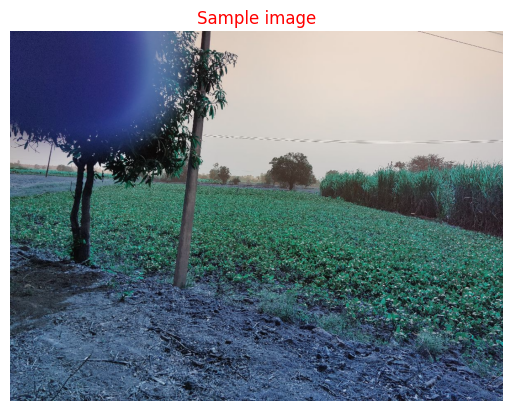

In [ ]:
#image with multiple crops in it
#"Pramod_gt_20211216_100013486.jpg","Siddarth_gt_20211216_103611967.jpg"

multi_crop_img = cv2.imread("training_dataset/images/Pramod_gt_20211216_100013486.jpg",  cv2.COLOR_BGR2RGB)
plt.imshow(multi_crop_img)
plt.title('Sample image', color = 'red')
plt.axis('off')
plt.show()

In [ ]:
data.query("image_name=='Pramod_gt_20211216_100013486.jpg'")['label_name'].tolist()

['sugarcane', 'black gram', 'black gram', 'black gram']

All the images are not of same size, here below is overview of image sizes.

In [ ]:
#biggest image and smalles image by size
data['image_size'] = data['image_width']*data['image_height']

min(data['image_size'].tolist()), sum(data['image_size'].tolist())/len(data['image_size'].tolist()), max(data['image_size'].tolist())

(48440, 8240705.92586491, 48000000)

# Data Preprocessing

## Remove Special Character

There are images with special character (356-508). Remove those special characters.

In [ ]:
data['image_name'] = data['image_name'].str.replace("$", "")

## Remove the images which do not have annotation

In [ ]:
raw_path = "training_dataset/"

processed_path  = raw_path+"processed_images/"
prev_path = raw_path+"images/"

if "processed_images" not in os.listdir(raw_path):
    os.mkdir(processed_path)

for img_name in os.listdir(prev_path):
    shutil.copy(prev_path+img_name, processed_path+img_name.replace("$", ""))

In [ ]:
missing_annotated_files = list(set(img_files).difference(set(images_in_dataframe)))
# missing_annotated_files

for image in missing_annotated_files:
    os.remove(processed_path+image)

In [ ]:
f"Number of raw images: {len(os.listdir(prev_path))}, Number of filtered images: {len(os.listdir(processed_path))}, total number of missing image's annotations: {len(os.listdir(prev_path))-len(os.listdir(processed_path))}"

"Number of raw images: 507, Number of filtered images: 487, total number of missing image's annotations: 20"

In [ ]:
images_in_df = set(data['image_name'])
img_files = set(os.listdir(processed_path))

print(f"Number of images that are in image folder but not in annottion file : {len(img_files.difference(images_in_df))}")
print(f"Number of images that are in annotation file but not in image folder : {len(images_in_df.difference(img_files))}")

Number of images that are in image folder but not in annottion file : 0
Number of images that are in annotation file but not in image folder : 0


Let's create the x_max and y_max column using the corresponding bbox_x, bbox_width and bbox_y, bbox_height.

In [ ]:
data = data.rename(columns={"bbox_x":"x_min", "bbox_y":"y_min"})
data['x_max'] = data['x_min'] + data['bbox_width']
data['y_max'] = data['y_min'] + data['bbox_height']
# data.head()

## Inspect bounding boxes


In [ ]:
len(data.query("x_max <= image_width and y_max <= image_height"))

607

## Resize images and creating bboxes in  ((x_min,y_min, x_max, y_max) format

In [ ]:
def resize_image_with_bbox(img_path, img_width, img_height, target_size):

    img = cv2.imread(img_path, cv2.COLOR_BGR2RGB)
    x_scale = target_size / img_width
    y_scale = target_size / img_height
    img = cv2.resize(img, (target_size, target_size))
    return (img, x_scale, y_scale)

processed_path = "training_dataset/processed_images/"
resized_path = "training_dataset/resized_images/"

if "resized_images" not in os.listdir("training_dataset/"):
    os.mkdir(resized_path)

x_min_resized, x_max_resized = [], []
y_min_resized, y_max_resized = [], []

target_size = 224
for _, row in data.iterrows():
    img_path = processed_path+row['image_name']
    image_width = row['image_width']
    image_height = row['image_height']
    img, x_scale, y_scale = resize_image_with_bbox(img_path, image_width, image_height, target_size)
    x_min = row['x_min']
    x_max = row['x_max']
    y_min = row['y_min']
    y_max = row['y_max']
    x_min_resized.append(int(np.round(x_min * x_scale)))
    y_min_resized.append(int(np.round(y_min * y_scale)))
    x_max_resized.append(int(np.round(x_max * x_scale)))
    y_max_resized.append(int(np.round(y_max * y_scale)))
    #write resized image
    cv2.imwrite(resized_path+row['image_name'], img)

data['x_min_resized'] = x_min_resized
data['x_max_resized'] = x_max_resized
data['y_min_resized'] = y_min_resized
data['y_max_resized'] = y_max_resized

## Check the data validity after resizing

In [ ]:
print(f"Before: data frame size is {len(data)}")
data_1 = data.query("x_max_resized <= 224 and y_max_resized <= 224")
data_2 = data.query("x_max_resized != x_min_resized and y_min_resized !=y_max_resized")
#get the list of images not satisfying the above condition
incorrect_images = set(data['image_name']).difference(set(data_1['image_name'])).union(set(data['image_name']).difference(set(data_2['image_name'])))
for i in incorrect_images:
    print(i)
    os.remove(resized_path+"/"+i)

data = data.query("x_max_resized <= 224 and y_max_resized <= 224").query("x_max_resized != x_min_resized and y_min_resized !=y_max_resized")
print(f"After: dataframe size is {len(data)}")

Before: data frame size is 607
35472bb3-d85f-11e9-90fc-b7cb9a623b4e9f7abaf7-ec2b-11e9-b6f4-697f5aae065f7b79a9b1-59b1-4423-9efd-05e8e1276685.jpg
After: dataframe size is 606


## Data Augmentation

In [ ]:
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(target_size),
    # transforms.RandomCrop(target_shape),
    # transforms.GaussianBlur(11, sigma=(0.1, 2.0)),
    # transforms.RandomRotation(degrees=90),
    # transforms.RandomHorizontalFlip(p=0.5),
    # transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomHorizontalFlip(),
    transforms.RandomAutocontrast(),
    transforms.ColorJitter(),
    # transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0, hue=0.1),
    transforms.ToTensor(),
])

## Data Preperation

In [ ]:
class FRCNNLoader(Dataset):
  def __init__(self, img_path, annot_info, classes, transforms=None):
    super().__init__()
    print("Intializing...")

    self.image_dir = img_path
    self.annot_info = annot_info
    self.classes = classes
    self.transforms = transforms
    self.image_paths = glob.glob(f"{img_path}/*.jpg")
    print("Number of images: ",len(self.image_paths))
    all_images = [image_path.split(os.path.sep)[-1] for image_path in self.image_paths]
    self.all_images = sorted(all_images)

    #encode labels to their index in classes variable
    for i in self.annot_info.index:
      label = self.annot_info.loc[i, 'label_name']
      self.annot_info.loc[i, 'label_name'] = self.classes.index(label)

    print("Dataset Prepared...")

  #for getting item by their index
  def __getitem__(self, idx):
    target = {}
    # Read input image
    image_name = self.all_images[idx]
    image_path = os.path.join(self.image_dir, image_name)
    image = cv2.imread(image_path)
    # Scaling img
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image = torch.from_numpy(image).permute(2,0,1)

    # Fetch meta data for given image
    annot_info = self.annot_info[self.annot_info['image_name'] == image_name]
    assert len(annot_info) != 0
    boxes = torch.Tensor(annot_info[['x_min_resized', 'y_min_resized', 'x_max_resized', 'y_max_resized']].values).float()
    labels = torch.LongTensor(annot_info['label_name'].values.tolist())
    #incase transformation is enabled
    if self.transforms:
        image = self.transforms(image)

    target["boxes"] = boxes
    target["labels"] = labels
    return image, target

  def __len__(self):
    return len(self.all_images)


In [ ]:
classes = sorted(list(set(data['label_name'])))
img_dir = "training_dataset/resized_images"
dataset = FRCNNLoader(img_dir, data.copy(), classes, transforms=transform)

Intializing...
Number of images:  486
Dataset Prepared...


## Visualize Prepared images with bounding boxes

In [ ]:
import matplotlib.patches as patches

def plot_image(img, boxes, scores, labels, classes, save_path=None):

  cmap = plt.get_cmap("tab20b")
  class_labels = np.array(classes)
  colors = [cmap(i) for i in np.linspace(0, 1, len(class_labels))]
  height, width, _ = img.shape
  # Create figure and axes
  fig, ax = plt.subplots(1, figsize=(16, 8))
  # Display the image
  ax.imshow(img)
  for i, box in enumerate(boxes):
    class_pred = labels[i]
    conf = scores[i]
    width = box[2] - box[0]
    height = box[3] - box[1]
    rect = patches.Rectangle((box[0], box[1]), width,height, linewidth=2, edgecolor=colors[int(class_pred)],
        facecolor="none",)
    # Add the patch to the Axes
    ax.add_patch(rect)
    plt.text(
        box[0], box[1],
        s=class_labels[int(class_pred)] + " " + str(int(100*conf)) + "%",
        color="white",
        verticalalignment="top",
        bbox={"color": colors[int(class_pred)], "pad": 0},
    )

  #for saving result
  if save_path is not None:
    plt.savefig(save_path)

  plt.show()

Image index:  0


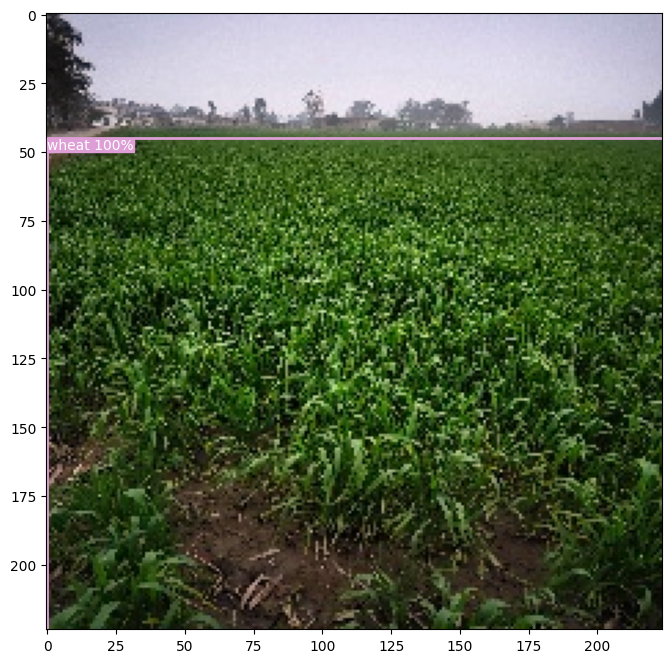

Image index:  1


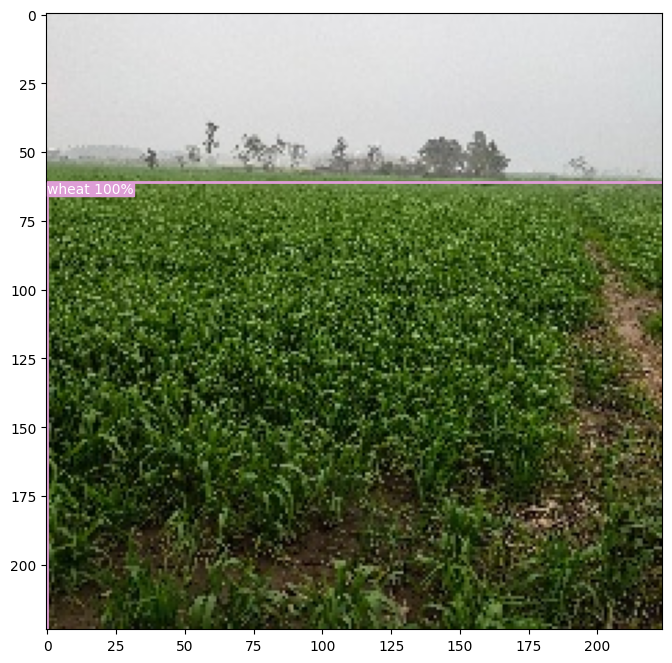

Image index:  2


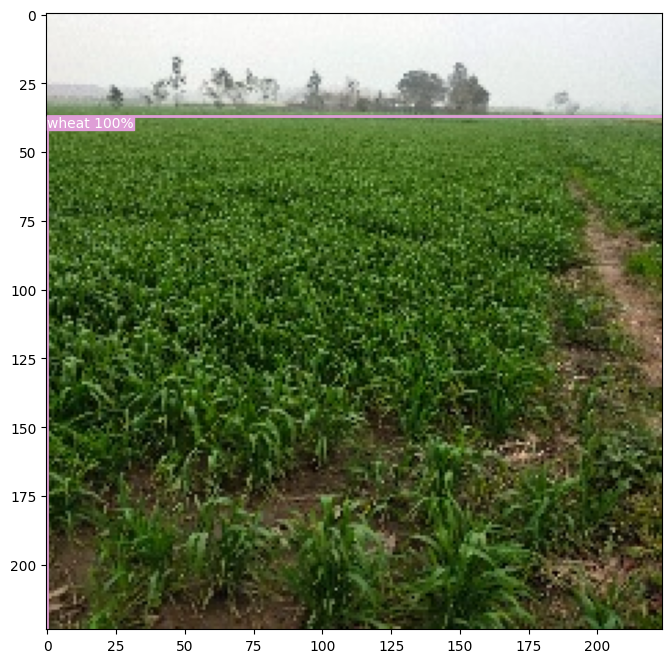

Image index:  3


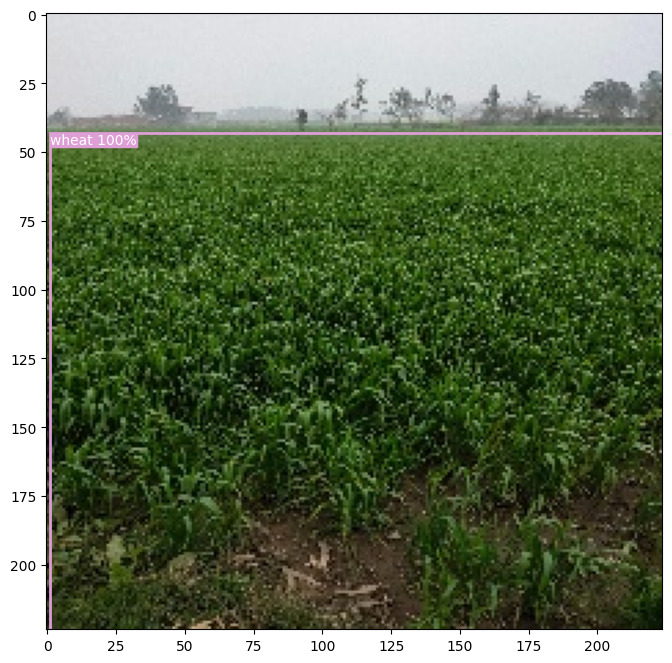

Image index:  4


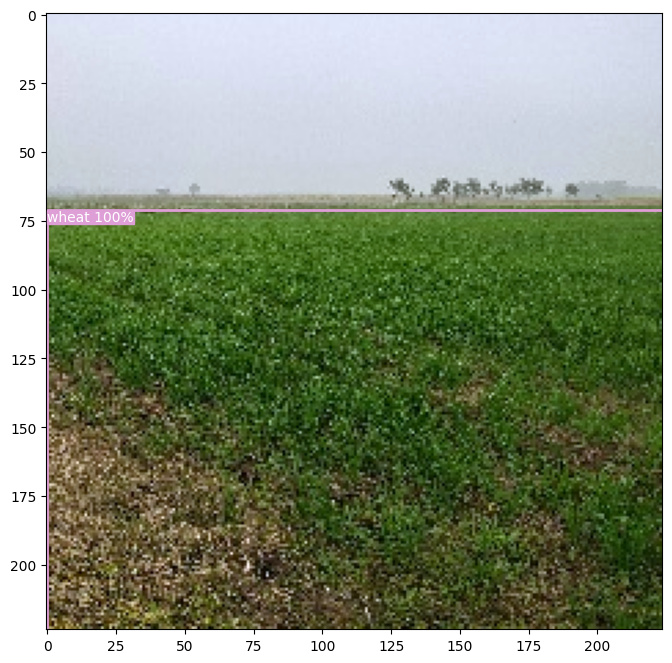

Image index:  5


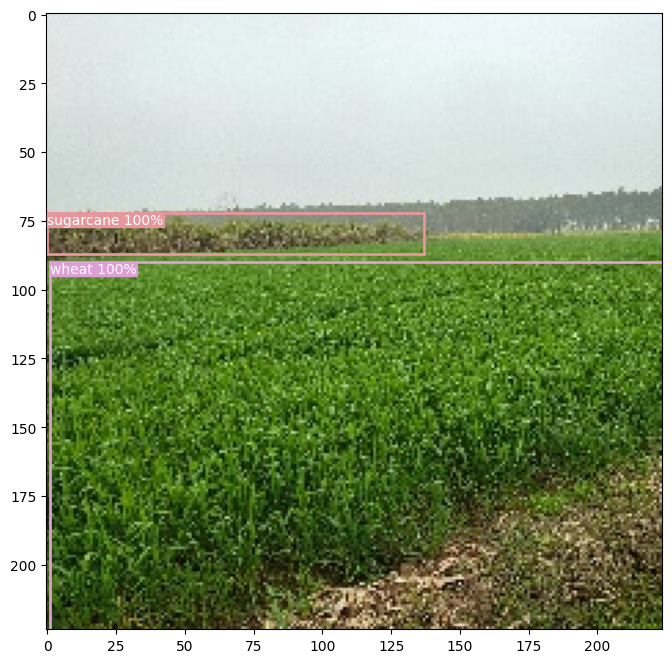

In [ ]:
sample_images = 6
for i in range(sample_images):
  # x = random.randint(0, (len(dataset)-1))
  img, target = dataset[i]
  img = img.cpu().permute(1,2,0).numpy()
  boxes = target['boxes'].numpy()
  labels = target['labels'].numpy()
  scores = [1]*len(labels)
  print("Image index: ", i)
  plot_image(img, boxes, scores, labels, classes)

In [ ]:
full_dataset = FRCNNLoader(img_dir, data.copy(), classes, transforms=None)
# define training and validation data loaders
def collate_fn(batch):
  return tuple(zip(*batch))

# data_loader_train = DataLoader(full_dataset, batch_size=CONFIGURATION["BATCH_SIZE"], collate_fn=collate_fn, shuffle=True, drop_last=True)
# data_loader_test = DataLoader(full_dataset, batch_size=1, collate_fn=collate_fn, shuffle=False, drop_last=True)

Intializing...
Number of images:  486
Dataset Prepared...


## Train Val Test Split

In [ ]:
# Define the split sizes
train_size = int(0.8 * len(full_dataset))
val_size = int(0.10 * len(full_dataset))
test_size = len(full_dataset) - train_size - val_size

# Split the dataset
train_dataset, val_dataset, test_dataset = random_split(full_dataset, [train_size, val_size, test_size])

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn)


In [ ]:
# from torch.utils.data.sampler import SubsetRandomSampler
# from sklearn.model_selection import train_test_split

# # Create the indices for the dataset
# dataset_size = len(data)
# indices = list(range(dataset_size))
# validation_split = 0.2
# test_split = 0.5

# # Split the indices into train and validation
# train_indices, val_ind = train_test_split(indices, test_size=validation_split, random_state=42)
# val_indices, test_indices = train_test_split(val_ind, test_size=test_split, random_state=50)

# # Creating PT data samplers and loaders:
# train_sampler = SubsetRandomSampler(train_indices)
# valid_sampler = SubsetRandomSampler(val_indices)
# test_sampler = SubsetRandomSampler(test_indices)

# train_loader = DataLoader(full_dataset, batch_size=16, collate_fn=collate_fn, sampler=train_sampler, drop_last=True)
# val_loader = DataLoader(full_dataset, batch_size=1, collate_fn=collate_fn, shuffle=False, sampler=valid_sampler, drop_last=True)
# test_loader = DataLoader(full_dataset, batch_size=1, collate_fn=collate_fn, shuffle=False, sampler=test_sampler, drop_last=True)

In [ ]:
len(data), len(train_loader), len(train_loader)*16, len(val_loader), len(test_loader)

(606, 25, 400, 3, 4)

## Model building

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f"We are using {device}")

#load pretrained model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights='FasterRCNN_ResNet50_FPN_Weights.DEFAULT')
# model = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(weights='FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT')#ViT
# model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_fpn(weights='FasterRCNN_MobileNet_V3_Large_FPN_Weights.DEFAULT')#mobilenetv3-High resolution
# model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_320_fpn(weights='FasterRCNN_MobileNet_V3_Large_320_FPN_Weights.DEFAULT')#mobilenetv3-low resolution

#number of classes
num_classes = len(classes)

#get the number of units in last layer
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
model.to(device)

We are using cuda


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 119MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
# construct an optimizer
num_layers_to_unfreeze = 10
# Iterate through the model parameters in reverse order
for param in reversed(list(model.parameters())):
    param.requires_grad = True
    num_layers_to_unfreeze -= 1
    if num_layers_to_unfreeze < 0:
        param.requires_grad = False

## Class_weight assignment to handle Class Imbalancy

1. Class weights

2. Focal Loss

In [ ]:
class_counts = np.unique(data[['label_name']], return_counts=True)[1]
total_samples = len(data[['label_name']])
class_weights = []
for count in class_counts:
    weight = 1 / (count / total_samples)
    class_weights.append(weight)
# class_weights

In [ ]:
# Set the class weights
model.class_weight = class_weights

# Fine Tunning

In [ ]:
CONFIGURATION = { "RANDOM_SEED" : 42,
                  "BATCH_SIZE" : 16,
                  "EPOCHS" : 50,
                  "LR" : 0.005,
                  "MOMENTUM" : 0.9,
                  "LR_SCHED_GAMMA" : 0.15,
                  "WEIGHT_DECAY" : 0.01,
                 }

In [ ]:
def evaluate(model, data_loader, device):
    val_loss_list = []
    for i, data in enumerate(data_loader):
        images, targets = data
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        with torch.no_grad():
            losses = model(images, targets)

        loss = sum(loss for loss in losses.values())
        loss_val = loss.item()
        val_loss_list.append(loss_val)
    print("val_loss: {}".format(np.mean(val_loss_list)))
    return val_loss_list

## Optimizer

In [ ]:
params = [p for p in model.parameters() if p.requires_grad]
# print(len(params))

#Set up optimizer
optimizer = torch.optim.SGD(params, lr=CONFIGURATION['LR'], momentum=CONFIGURATION['MOMENTUM'], weight_decay=CONFIGURATION['DECAY_RATE'])
# optimizer = torch.optim.AdamW(params, lr=CONFIGURATION['LR'], betas=(0.9, 0.999), eps=1e-08, weight_decay=CONFIGURATION['WEIGHT_DECAY'])
# optimizer = torch.optim.Adam(params, lr=CONFIGURATION['LR'], betas=(0.9, 0.999), eps=1e-08, weight_decay=CONFIGURATION['WEIGHT_DECAY'])

# #Set up learning rate scheduler
# sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, lr, epochs=epochs, steps_per_epoch=len(train_loader))
# sched = torch.optim.lr_scheduler.StepLR(optimizer, step_size, gamma=0.1, last_epoch=-1, verbose='deprecated')
# sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.1, last_epoch=-1, verbose='deprecated')


# def get_lr(optimizer):
#     for param_group in optimizer.param_groups:
#         return param_group['lr']

def train_one_epoch(model, optimizer, data_loader, device):
    model.to(device)
    model.train()
    train_loss_list = []
    train_loss_dict = []
    # lrs = []

    # if epoch == 0:
    #   warmup_factor = 1.0 / 1000 # do lr warmup
    #   warmup_iters = min(1000, len(data_loader) - 1)
    #   lr_scheduler = optim.lr_scheduler.LinearLR(optimizer, start_factor = warmup_factor, total_iters=warmup_iters)

    for idx, data in enumerate(data_loader):
        # print(f"iterations : {idx+1}")
        images, targets = data
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        losses = model(images, targets) # the model computes the loss automatically if we pass in the targets
        loss_dict_append = {k: v.item() for k,v in losses.items()}
        loss = sum(loss for loss in losses.values())
        loss_val = loss.item()

        train_loss_list.append(loss_val)
        train_loss_dict.append(loss_dict_append)

        # if not math.isfinite(loss_val):
        #   print(f"Loss is {loss_val}, stopping training") # train if loss becomes infinity
        #   print(f"Loss")
        #   sys.exit(1)

        # # Gradient clipping
        # if grad_clip:
        #     nn.utils.clip_grad_value_(model.parameters(), grad_clip)

        # # Record & update learning rate
        # if sched:
        #    lrs.append(get_lr(optimizer))
        #    sched.step()

        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

    train_loss_dict = pd.DataFrame(train_loss_dict)
    print("Epoch {}, lr: {}, train_loss: {}, loss_classifier: {}, loss_box: {}, loss_rpn_box: {}, loss_object: {}".format(epoch, optimizer.param_groups[0]['lr'], np.mean(train_loss_list),train_loss_dict['loss_classifier'].mean(),
        train_loss_dict['loss_box_reg'].mean(),
        train_loss_dict['loss_rpn_box_reg'].mean(),
        train_loss_dict['loss_objectness'].mean(),
    ))
    return train_loss_list

In [ ]:
#train the model and note down both losses
loss_dict = {'train_loss': [], 'valid_loss': []}
CONFIGURATION["NUM_EPOCHS"] = 50

for epoch in range(CONFIGURATION["NUM_EPOCHS"]):
    train_loss_list = train_one_epoch(model, optimizer, train_loader, device)
    loss_dict['train_loss'].extend(train_loss_list)

    # evaluation
    val_loss_list = evaluate(model, val_loader, device)
    loss_dict['valid_loss'].extend(val_loss_list)
    # print("Epoch {}, train_loss: {}, val_loss: {}".format(epoch+1, np.mean(train_loss_list), np.mean(val_loss_list)))

Epoch 0, lr: 0.005, train_loss: 0.7048849070072174, loss_classifier: 0.3238257324695587, loss_box: 0.0737142513692379, loss_rpn_box: 0.03318020053207874, loss_object: 0.2741647058725357
val_loss: 0.4314810236295064
Epoch 1, lr: 0.005, train_loss: 0.4644692152738571, loss_classifier: 0.08570241644978523, loss_box: 0.07097626611590385, loss_rpn_box: 0.032718017529696226, loss_object: 0.2750725144147873
val_loss: 0.4185074369112651
Epoch 2, lr: 0.005, train_loss: 0.44904628276824954, loss_classifier: 0.07605498924851417, loss_box: 0.07054637894034385, loss_rpn_box: 0.03219538196921348, loss_object: 0.27024953238666055
val_loss: 0.4145279824733734
Epoch 3, lr: 0.005, train_loss: 0.45286682367324826, loss_classifier: 0.07285375028848648, loss_box: 0.06931325763463975, loss_rpn_box: 0.03231265692040324, loss_object: 0.2783871550858021
val_loss: 0.42016565799713135
Epoch 4, lr: 0.005, train_loss: 0.4389976644515991, loss_classifier: 0.07054885789752006, loss_box: 0.06676150858402252, loss_rpn

## Loss analysis

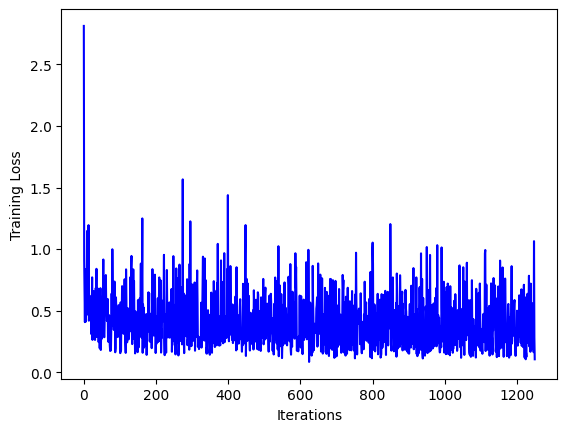

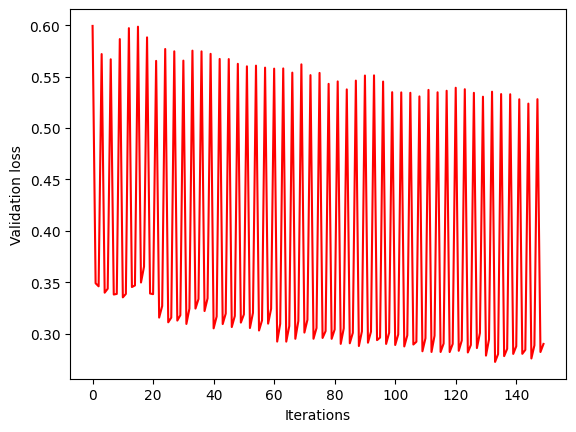

In [ ]:
def plot_loss(train_loss, valid_loss):

    figure_1, train_ax = plt.subplots()
    figure_2, valid_ax = plt.subplots()

    train_ax.plot(train_loss, color='blue')
    train_ax.set_xlabel('Iterations')
    train_ax.set_ylabel('Training Loss')

    valid_ax.plot(valid_loss, color='red')
    valid_ax.set_xlabel('Iterations')
    valid_ax.set_ylabel('Validation loss')
plot_loss(loss_dict['train_loss'], loss_dict['valid_loss'])

## Save weights

In [ ]:
# save model's weight
torch.save(model.state_dict(), '/content/drive/MyDrive/Dataset/model_weights.pth')

# save model
torch.save(model, '/content/drive/MyDrive/Dataset/entire_model.pth')

## Load the model

In [ ]:
# modelrcnn = model.load_state_dict(torch.load("/content/model_weights.pth"))
modelrcnn = torch.load("/content/drive/MyDrive/Dataset/entire_model.pth")
modelrcnn.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

# Prediction

## Testing

In [ ]:
#for making inference on per image level
def inference(img, model, detection_threshold=0.26):
    # model.eval()
    torch.cuda.empty_cache()
    img = img.to(device)
    prediction = model([img])
    return prediction

def decode_output(output):
    bbs = output['boxes'].cpu().detach().numpy().astype(np.uint16)
    labels = np.array([i for i in output['labels'].cpu().detach().numpy()])
    confs = output['scores'].cpu().detach().numpy()
    idxs = nms(torch.tensor(bbs.astype(np.float32)), torch.tensor(confs), 0.001)
    bbs, confs, labels = [tensor[idxs] for tensor in [bbs, confs, labels]]
    if len(idxs) == 1:
        bbs, confs, labels = [np.array([tensor]) for tensor in [bbs, confs, labels]]
    return bbs.tolist(), confs.tolist(), labels.tolist()

In [ ]:
# from torchvision.utils import draw_bounding_boxes
# img = cv2.imread("/content/training_dataset/images/Pramod_gt_20211215_115712457.jpg")
# # image = cv2.imread("sample_image.jpg")
# #normalize img
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
# image = img/255.0
# image = torch.from_numpy(image).permute(2,0,1)
# # image = torch.tensor(image).permute(1,2,0)
# image_int = torch.tensor(img, dtype=torch.uint8)

# #get predictions
# # with torch.no_grad():
# pred = inference(image, modelrcnn)[0]
# boxes, scores, labels = decode_output(pred)
# print("boxes, scores, labels ", boxes, scores, labels)
# fig = plt.figure(figsize=(14,10))
# plt.imshow(draw_bounding_boxes(image_int, boxes,
#             [classes[i] for i in pred['labels'][scores > 0.8].tolist()], width=4))

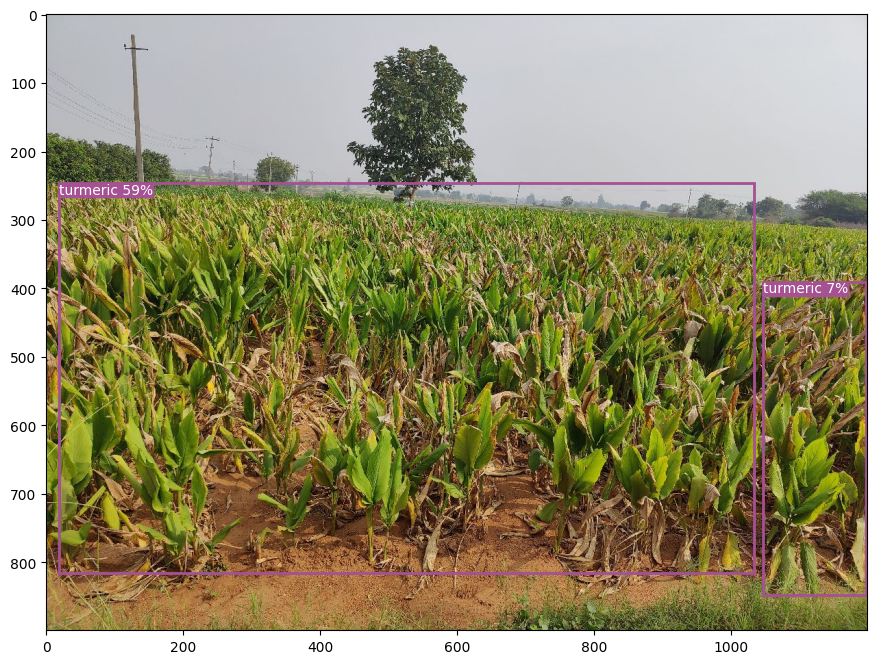

In [ ]:
def plot_test_result(test_image):
    image = cv2.imread(test_image)
    #normalize img
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image = torch.from_numpy(image).permute(2,0,1)
    image = image.to(device)

    #get predictions
    outputs = inference(image, modelrcnn)[0]

    boxes, scores, labels = decode_output(outputs)
    #plot the prediction
    image = image.squeeze(0).cpu().permute(1,2,0).numpy()
    plot_image(image, boxes, scores, labels, classes)

image = "/content/training_dataset/images/Pramod_gt_20211215_101650737.jpg"
plot_test_result(image)

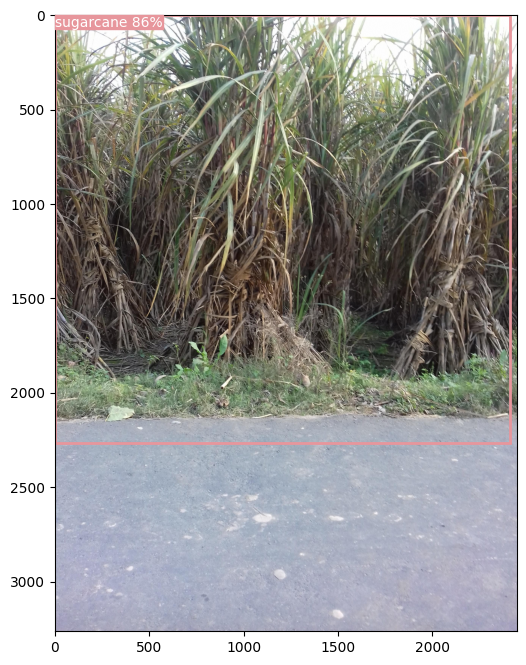

In [ ]:
image = "/content/training_dataset/images/35472bb3-d85f-11e9-90fc-b7cb9a623b4e$$9f7abadb-ec2b-11e9-b6f4-591ca6fe325c$$9c98f568-e1d6-4ade-827f-6b603e7c97e9.jpg"
plot_test_result(image)

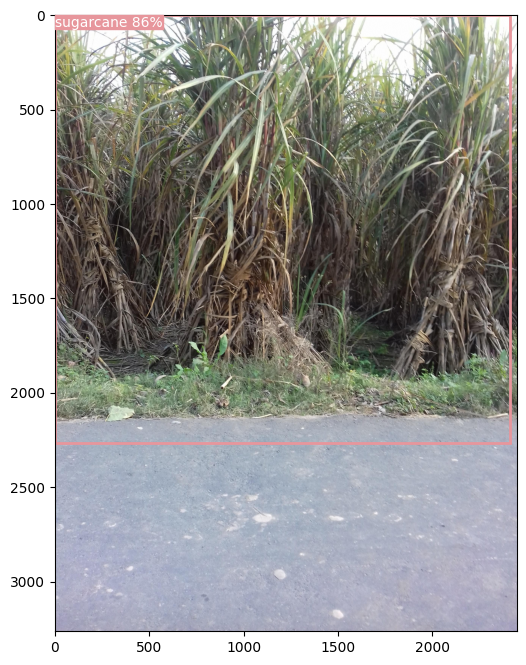

In [ ]:
"/content/training_dataset/images/Pramod_gt_20211215_102352478.jpg"
plot_test_result(image)

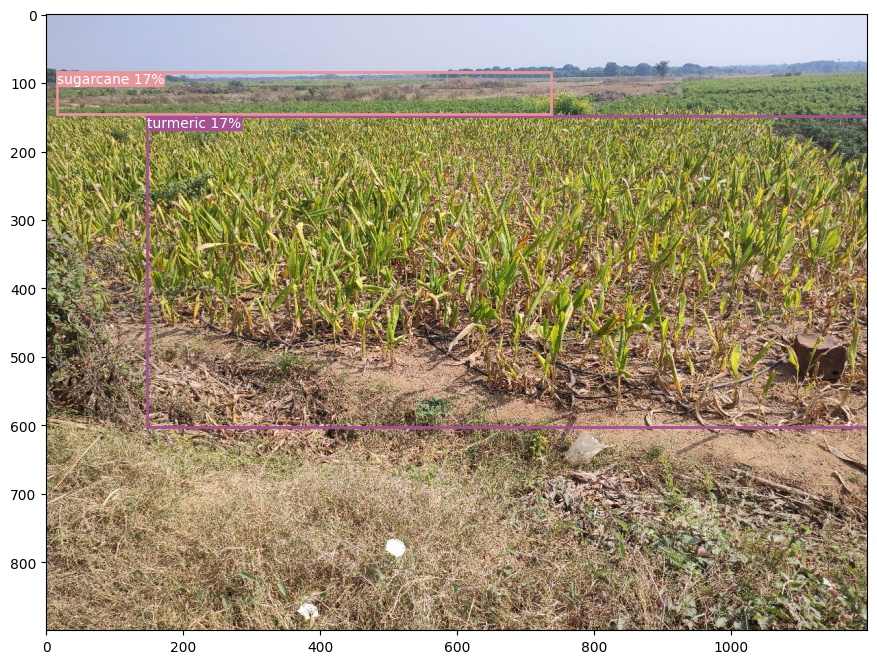

In [ ]:
image = "/content/training_dataset/images/Siddarth_gt_20211216_112835799.jpg"
plot_test_result(image)

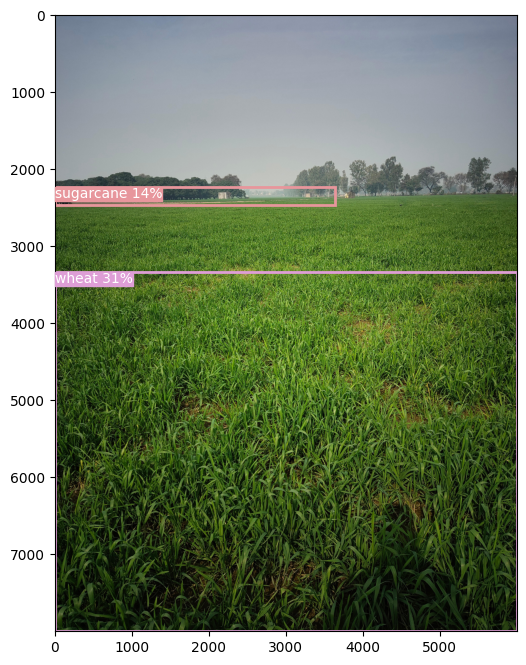

In [ ]:
image = "/content/training_dataset/images/35472bb3-d85f-11e9-90fc-b7cb9a623b4e$$9f7abaec-ec2b-11e9-b6f4-59591b84a5f3$$b4e3e6e6-4648-4bd6-b1f6-a4bb0960ab24.jpg"
plot_test_result(image)

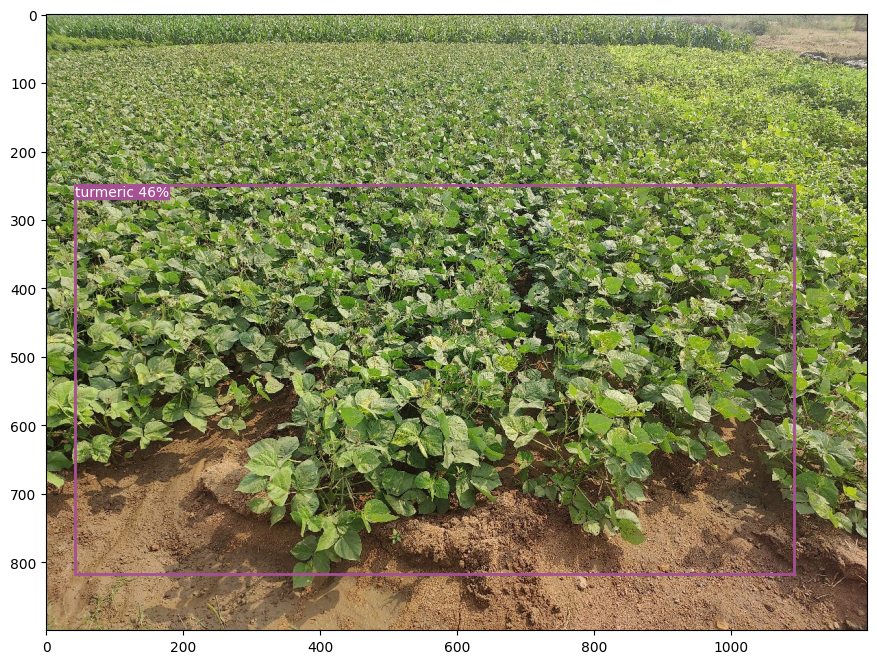

In [ ]:
image = "/content/training_dataset/images/Pramod_gt_20211215_111552899.jpg"
plot_test_result(image)

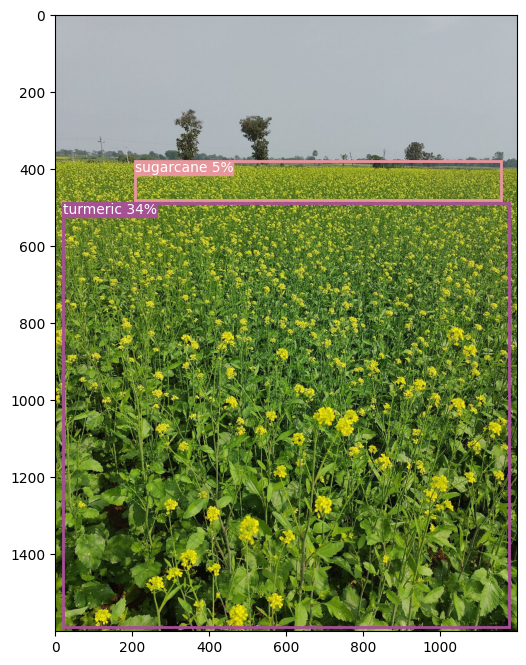

In [ ]:
image = "/content/training_dataset/images/Pramod_gt_20211215_110915069.jpg"
plot_test_result(image)

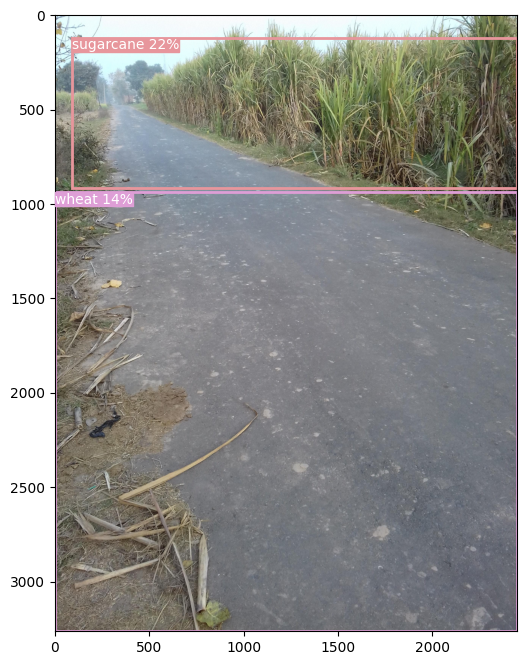

In [ ]:
image = "/content/training_dataset/images/35472bb3-d85f-11e9-90fc-b7cb9a623b4e$$9f7abadb-ec2b-11e9-b6f4-591ca6fe325c$$f3ee2a77-ce15-4305-a337-ef51badf4ceb.jpg"
plot_test_result(image)

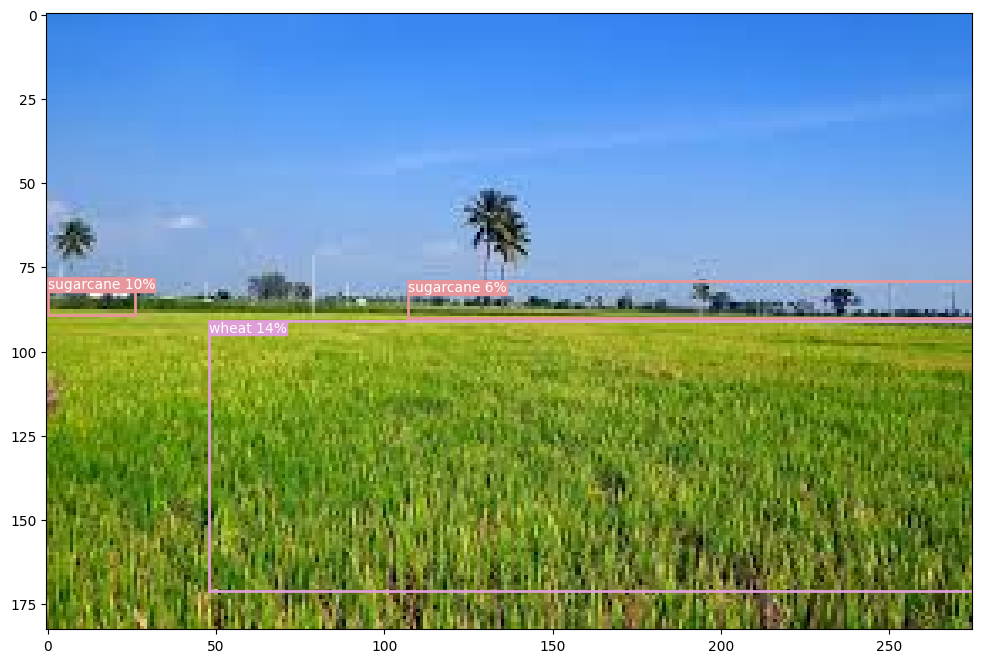

In [ ]:
image = "/content/training_dataset/images/images6.jpg"
plot_test_result(image)

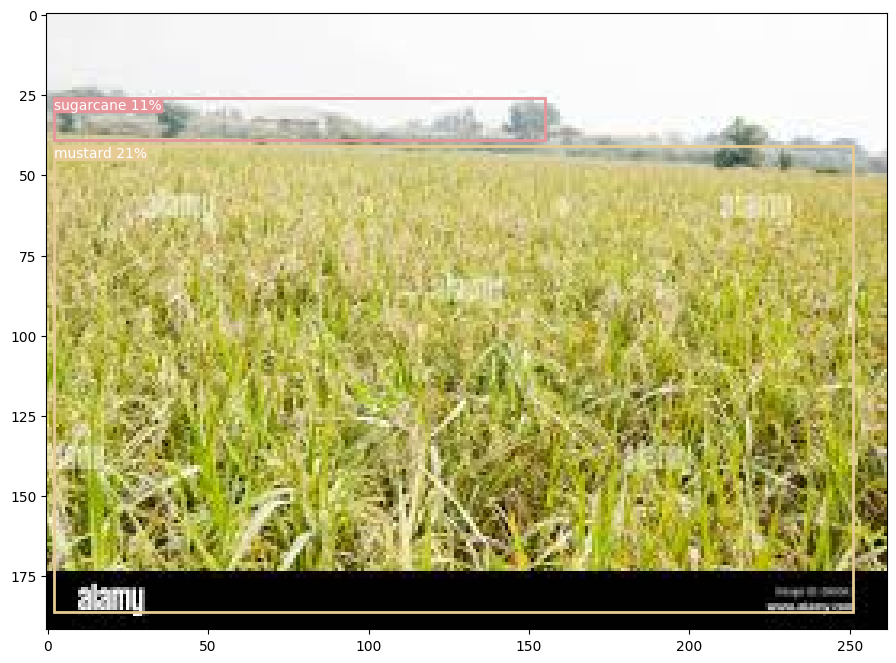

In [ ]:
image = "/content/training_dataset/images/images30.jpg"
plot_test_result(image)

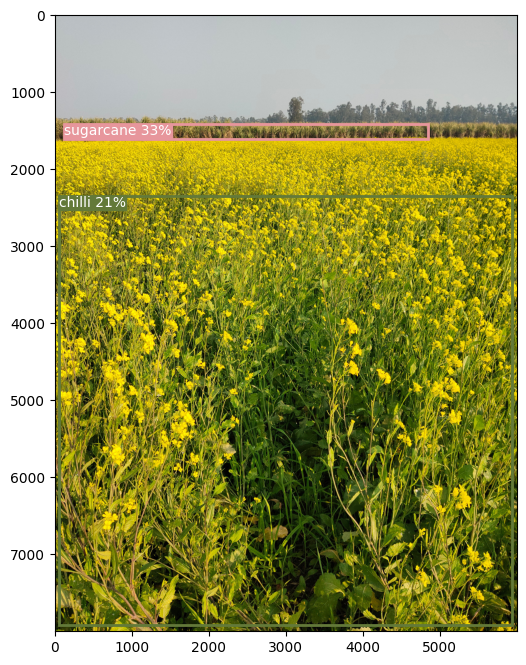

In [ ]:
image = "/content/training_dataset/images/35472bb3-d85f-11e9-90fc-b7cb9a623b4e$$9f7e3dee-ec2b-11e9-b6f4-173f231ef43e$$eab6acd0-040e-4ac8-8082-6d05a7a2c378.jpg"
plot_test_result(image)

In [ ]:
!wget -O test_image1.jpg "https://cdn.britannica.com/67/125067-050-F318A0E6/Sugarcane.jpg"

--2024-05-16 07:27:16--  https://cdn.britannica.com/67/125067-050-F318A0E6/Sugarcane.jpg
Resolving cdn.britannica.com (cdn.britannica.com)... 99.84.252.26, 99.84.252.14, 99.84.252.94, ...
Connecting to cdn.britannica.com (cdn.britannica.com)|99.84.252.26|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 629753 (615K) [image/jpeg]
Saving to: ‘test_image1.jpg’

test_image1.jpg     100%[===================>] 614.99K  --.-KB/s    in 0.09s   

2024-05-16 07:27:16 (6.81 MB/s) - ‘test_image1.jpg’ saved [629753/629753]



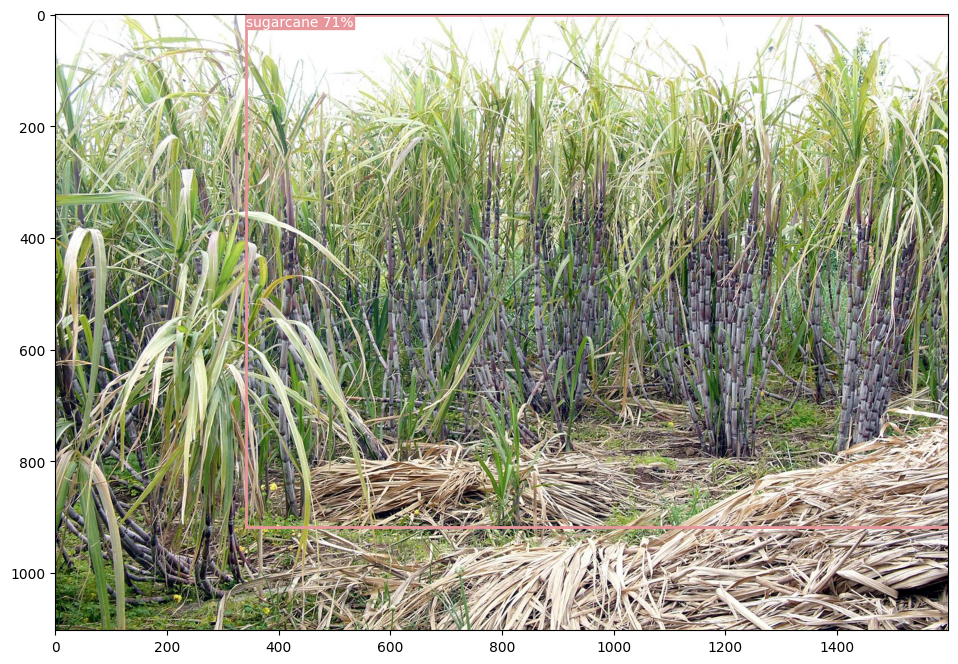

In [ ]:
image = "test_image1.jpg"
plot_test_result(image)

# Analysis Report

**Areas of improvement**

So far, I have fine tunned  FasterRCNN  (ResNet50) model on our dataset following the basic model fine tunning strategy and have tested the model on test dataset. The fine tunned model is doing pretty well against the given data set, fine tunning time and compute resources.

There are following key approaches that can significantly help to improve improve the model performance and inference time.

## Data Preprocessing

After the model performance evaluation, I can see that a good amount of time needed on data preprocessing of the given dataset.

1. I have applied some techniques like Contrast and Brightness. But more techniques GaussianBlur, Rotation, Flip, etc, needed.

2. Along with the above, We need to test and evaluate other filters e.g.
MedianBlur, BilateralFilte, Sobel, Scharr, Laplacian, Canny, Adaptive Thresholding, Dilation, Erosion, Morphological Transformations (Open, Close, Gradient, Top Hat, Black Hat) etc. Need to test these filters and select the some best to improve the image quality.

3. For some of the images, random background is being detected as Sugarcane, which can be ingonred by proper data preprocessing or by assigning a dummy name to that area.

4. Turmeric is being detected for other crops as well. The probable reason is: 1.) Turmeric is majority class. 2.) SOme images of other crops like weat, mustured, paddy, maze have similar distribution to turmeric. So the good data preprocessing and more image are needed for this class to have good varaition.

## Data Collection strategy

THe collected data seems very inconsistent, imbalanced, limited.  We can can try some/all techniques to collect high quality dataset.

1. Diverse and Representative Dataset.
2. Balanced Dataset
3. Consistent Image Quality
4. Use Multiple Sources
5. Proper Annotation and Labeling
6. Crowdsourcing
7. Synthetic Dat, etc.
8. Data and annotation validtion along with object annotation checks https://www.youtube.com/watch?v=40GqhTrMcNA



## Hyperparameter tunning

1. Need more hyperparmeter tunnings:
    1. Learning Rates
    2. Optimizers
    3. Batch Size
    4. IoU thresholds
    5. Weight Decay(L1, L2, L1L2)
    6. No-of Epochs,
    7. Early Stopping
    8. Gradiend Clipping(To avoid exploding gradient problem)
    9. Grid Serch, Random Search, etc.


2. This is the Class Imbalance problem with majority(150+ i.e. 25%) from turmeric class, and also in multi crop images turmeric is clearly visible. In my evaluation i can see that model is lerning more on turmeric class and ignoring the minority classes. (see the results in Testing section).

## Data Augmentation

1. I have tried just few Data augmentation methods available in PyTorch, but the more transform method will help in model learning.

2. Adding more images to minority classes because there are many classes which have even less than 10 images (potato and green gram).

3. Generative Models (GANs, VAEs) for sysnthetic data generation

4. Composite Methods (MixUp, CutMix, and Mosaic), etc.

## Other Models

There are some other Object Detection models. Which may perform significantly well on our datat set. I have seen ultralytics team have trained some YOLO models on agrcultural use cases. Here are some models worth trying:

1. YOLOv7/8n/s/m/l/x

2. YOLOv9c/e

3. Detectron 2 (RetinaNet, MaskRCNN etc.)

4. Grounding Dinov2

5. DETR, etc.



## Inference latency

The inference time can be also improved significantly by following methods and also there are tools which helps to improve the inference latecy by converting them into corresponding formats.

1. Quantization (Quantization Aware Training, Post Training Quantization)

2. Framework Optimization (ONNX, OpenVINO, TensorRT, TensorflowLite, PyTorchMobile)

3. Weight Prunning

4. Knowledge Distillation, etc.